# Visualisierung eines Textkorpus mit Flair Embeddings, Pandas und Plotly

## Import

In [1]:
from flair.embeddings import WordEmbeddings, FlairEmbeddings, StackedEmbeddings
from flair.data import Sentence
from umap import UMAP

import plotly.express as px
import pandas as pd

import string
import pickle

## Daten lesen und checken

In [4]:
df = pd.read_pickle('../data/flair-reden-bundesregierung.p')

In [5]:
df.head()

,person,titel,datum,untertitel,url,anrede,rohtext,ort,sentence_object
0,Gerhard Schröder,Rede des Bundeskanzlers zur Eröffnung der 52. ...,2002-02-06,"Man kann diese Filmfestspiele nicht eröffnen, ...",http://archiv.bundesregierung.de/bpaexport/red...,"Sehr geehrte Frau Nair, liebe Mitglieder der J...","es ist angekündigt worden, man sollte im Beruf...",None,"(Token: 1 es, Token: 2 ist, Token: 3 angekündi..."
1,Julian Nida-Rümelin,Redebeitrag von Staatsminister Nida-Rümelin in...,2002-02-01,"""Ich bin der Auffassung, wir müssen nicht nur ...",http://archiv.bundesregierung.de/bpaexport/red...,Meine sehr geehrten Damen und Herren!,"Frau Präsidentin! An Sie gerichtet, Herr Börn...",None,"(Token: 1 Frau, Token: 2 Präsidentin, Token: 3..."
2,Gerhard Schröder,Interview mit Bundeskanzler Schröder in 'Berli...,2002-04-14,In dem Interview äußert sich Bundeskanzler Sch...,http://archiv.bundesregierung.de/bpaexport/red...,NaN,Frage (Peter Hahne): Bevor wir uns über den Au...,None,"(Token: 1 Frage, Token: 2 (, Token: 3 Peter, T..."
3,Gerhard Schröder,Rede von Bundeskanzler Gerhard Schröder bei de...,2005-03-08,Der Kampf gegen die Arbeitslosigkeit ist eine ...,http://archiv.bundesregierung.de/bpaexport/red...,Herr Ministerpräsident! Lieber Herr Dr. Bernot...,"Einen Satz von Ihnen, Herr Dr. Bernotat, habe ...",None,"(Token: 1 Einen, Token: 2 Satz, Token: 3 von, ..."
4,Gerhard Schröder,Rede von Bundeskanzler Gerhard Schröder auf de...,2000-05-04,NaN,http://archiv.bundesregierung.de/bpaexport/red...,"Sehr geehrter Herr Professor Landfried, sehr ...",diese Jahresversammlung der Hochschulrektorenk...,None,"(Token: 1 diese, Token: 2 Jahresversammlung, T..."


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2983 entries, 0 to 2982
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   person           2983 non-null   object        
 1   titel            2982 non-null   object        
 2   datum            2983 non-null   datetime64[ns]
 3   untertitel       2088 non-null   object        
 4   url              2983 non-null   object        
 5   anrede           1447 non-null   object        
 6   rohtext          2983 non-null   object        
 7   ort              690 non-null    object        
 8   sentence_object  2983 non-null   object        
dtypes: datetime64[ns](1), object(8)
memory usage: 209.9+ KB


In [8]:
type(df.loc[0, 'sentence_object'])

flair.data.Sentence

Statt dem Laden der Pickle-Datei als Dataframe, der eine Spalte mit den Sentence-Objekt enthält, könnte auch mit flair.sentence aus der Spalte 'rohtext' in diesem Notebook für jede Rede ein Sentence-Objekt erstellt werden. 

## Filtern und Sample von Merkel-Reden

In [39]:
df_merkel = df[df.loc[:, 'person'] == 'Angela Merkel']

In [40]:
df_merkel.shape

(1128, 9)

In [41]:
df_merkel = df_merkel.sample(100, random_state=42)

In [42]:
df_merkel.shape

(100, 9)

## Erstellen der Stacked Flair Embeddings

In [34]:
embedding = WordEmbeddings('de')

In [35]:
flair_embedding_forward = FlairEmbeddings('de-forward')
flair_embedding_backward = FlairEmbeddings('de-backward')

In [36]:
stacked_embeddings = StackedEmbeddings([
                                        embedding,
                                        flair_embedding_forward,
                                        flair_embedding_backward,
                                       ])

In [46]:
%%time

# 1,5 Stunden für 100 Reden

df_merkel.loc[:, 'sentence_object_embeddings'] = df_merkel.loc[:, 'sentence_object'].apply(lambda text: stacked_embeddings.embed(text))

Wall time: 1h 31min 20s


In [316]:
# 'sentence_object_embeddings' ist ein None-Type
# aber bei 'sentence_object' sind die Embeddings hinzugekommen und können genutzt werden
# Frage ob, die direkte Wiederzuweisung auch funktioniert!
# df_merkel.loc[:, 'sentence_object'] = df_merkel.loc[:, 'sentence_object'].apply(lambda text: stacked_embeddings.embed(text))

In [393]:
# Die pickle-Datei mit 100 Merkel-Reden ist 7.5 GB groß
# ist zwar gespeichert, hat aber einen Fehler geworfen!
# >>>> Testen, ob die p-Datei genutzt werden kann
# >>>> Datei ist zu groß zum einlesen!

# df_merkel.to_pickle('../data/sample-reden-merkel-embeddings.p')

In [59]:
df_merkel.head()

,person,titel,datum,untertitel,url,anrede,rohtext,ort,sentence_object,sentence_object_embeddings
2591,Angela Merkel,Rede von Bundeskanzlerin Merkel anlässlich der...,2013-05-22,in Brüssel,http://www.bundesregierung.de/Content/DE/Rede/...,"Sehr geehrter Herr Oberrabbiner Goldschmidt,se...","Exzellenzen,\nIch möchte mich ganz herzlich fü...",Brüssel,"(Token: 1 Exzellenzen, Token: 2 ,, Token: 3 Ic...",None
2278,Angela Merkel,Eingangsstatement von Bundeskanzlerin Angela M...,2012-03-21,in Überherrn/Saarland,http://www.bundesregierung.de/Content/DE/Rede/...,NaN,In Überherrn/Saarland\nDankeschön für die Mögl...,NaN,"(Token: 1 In, Token: 2 Überherrn, Token: 3 /, ...",None
2002,Angela Merkel,Ansprache von der Bundeskanzlerin zur Übergabe...,2014-12-02,NaN,https://www.bundesregierung.de/Content/DE/Rede...,"Lieber Herr Kagermann,liebe Minister,Herr Gril...","Matthias Wissmann,\nIch begrüße Sie als die Ve...",Bundeskanzleramt,"(Token: 1 Matthias, Token: 2 Wissmann, Token: ...",None
1098,Angela Merkel,Rede von Bundeskanzlerin Angela Merkel anlässl...,2007-04-17,am 17. April 2007 in Stuttgart,http://www.bundesregierung.de/nn_914560/Conten...,"Meine Damen und Herren,","ich bin heute sehr gern zu Ihnen gekommen, ers...",None,"(Token: 1 ich, Token: 2 bin, Token: 3 heute, T...",None
2469,Angela Merkel,Rede von Bundeskanzlerin Angela Merkel anlässl...,2012-07-16,in Berlin,http://www.bundesregierung.de/Content/DE/Rede/...,"Lieber Peter Altmaier,sehr geehrte Ministerinn...",Vor allen Dingen sehr geehrter zukünftiger Gas...,Berlin,"(Token: 1 Vor, Token: 2 allen, Token: 3 Dingen...",None


In [276]:
type(df.loc[12, 'sentence_object'])

flair.data.Sentence

## Sentence Objekt in eine Liste 


In [295]:
sentences = df_merkel.loc[:, 'sentence_object'].to_list()

In [296]:
type(sentences[1])

flair.data.Sentence

In [297]:
len(sentences)

100

## Erstellen der gefilterten Matrix

In [298]:
with open('../data/stopwords.txt', 'r', encoding='utf-8') as f:
        stopwords = f.read().splitlines()

In [299]:
matrix = list()
words = list()

In [300]:
%%time

for sentence in sentences:
    
    for token in sentence:
        if token.text not in string.punctuation \
        and token.text.lower() not in stopwords \
        and token.text.lower() not in words:
            embedding = token.get_embedding().cpu().detach().numpy()
            matrix.append(embedding)
            word = token.text.lower()
            words.append(word)                

Wall time: 17.5 s


In [301]:
len(matrix)

17996

In [302]:
matrix[0]

array([ 0.31377   ,  0.17846   , -0.21725   , ..., -0.01388448,
        0.08151165,  0.08010601], dtype=float32)

In [303]:
len(words)

17996

In [304]:
words[0]

'exzellenzen'

## 3D-Scatterplot

In [326]:
reducer_3d = UMAP(n_components=3, metric='cosine', n_neighbors=15, min_dist=1)

In [327]:
%%time
reduced_matrix_3d = reducer_3d.fit_transform(matrix)

Wall time: 12.4 s


In [328]:
reduced_matrix_3d.shape

(17996, 3)

In [329]:
df_3d = pd.DataFrame.from_records(reduced_matrix_3d, columns=['x', 'y', 'z'])

In [330]:
df_3d.loc[:, 'word'] = words

In [331]:
df_3d.head()

,x,y,z,word
0,2.560881,12.605678,-1.975308,exzellenzen
1,-1.501302,2.385711,1.455916,herzlich
2,-0.385364,4.362664,5.477642,überaus
3,0.131403,5.073398,7.294792,freundschaftlichen
4,1.404233,10.458428,0.600880,empfang


In [335]:
# save to file
df_3d.to_csv('../data/100-gesampelte-Reden-Merkel-3d-min-dist-1.csv', index=False)

In [10]:
params = {'hover_data': {c: False for c in df_3d.columns},
          'hover_name': 'word'}

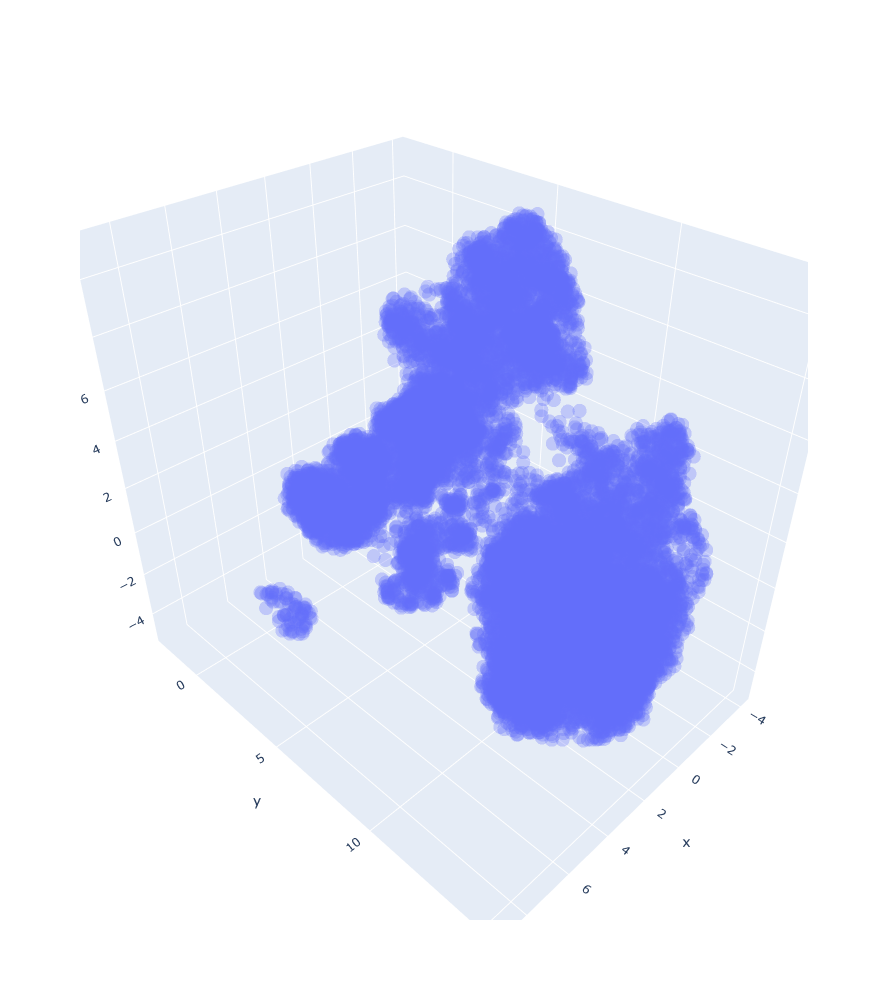

In [334]:
fig = px.scatter_3d(df_3d, x='x', y='y', z='z', opacity=0.3, size_max=3, width=1000, height=1000, **params)
fig.show()
fig.write_html('../img/100-gesampelte-Reden-Merkel-3d-min-dist-1.html')

## Highlight von Suchworten

In [2]:
df_test = pd.read_csv('../data/100-gesampelte-Reden-Merkel-3d-min-dist-1.csv')

In [383]:
df_test = df_3d.copy()

In [384]:
col_n = 'word'
search_term = 'empfang'
subframe = df_test.query(f"{col_n } == '{search_term}'")

In [356]:
subframe.index

Int64Index([4], dtype='int64')

In [4]:
df_test.loc[:, 'Suchwort'] = ''

In [5]:
df_test.head()

,x,y,z,word,Suchwort
0,2.560881,12.605678,-1.975308,exzellenzen,
1,-1.501302,2.385711,1.455916,herzlich,
2,-0.385364,4.362664,5.477642,überaus,
3,0.131403,5.073398,7.294792,freundschaftlichen,
4,1.404233,10.458428,0.600880,empfang,


In [6]:
search_terms = [ 'umwelt', 'kohl', 'europa', 'usa', 'obama']

for search_term in search_terms:
    
    subframe = df_test.query(f"word == '{search_term}'")
    df_test.loc[subframe.index, 'Suchwort'] = search_term 

In [7]:
params = {'hover_data': {c: False for c in df_test.columns},
          'hover_name': 'word'}

In [8]:
fig = px.scatter_3d(df_test, x='x', y='y', z='z', 
                    opacity=0.3,
                    color='Suchwort',
                    size_max=3, 
                    width=1000, 
                    height=1000,                    
                    **params)
fig.show()
# fig.write_html('../img/100-gesampelte-Reden-Merkel-3d-min-dist-1-suchwort.html')